In [227]:
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.animation as anm
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # High quality graphics
plt.rcParams['animation.html'] = 'html5'

import sys
import time

In [228]:
# Time step progress bar
def update_progress_bar(current, total):
    sys.stdout.write('\rTime step: [{:<50}] {:.0f}/{:.0f} ({:.2f}%)'.format('=' * int(current/total * 50), current, total, current*100/total))
    sys.stdout.flush()

In [229]:
pip install Pillow

Note: you may need to restart the kernel to use updated packages.


- The governing equation to be solved is of the linear 1st order hyperbolic PDE form. It is given by:

$$\frac{\partial \phi}{\partial t} = -\frac{\partial F}{\partial x}$$

$\quad\quad$ where, $F = u\phi$. It is assumed that the velocity solution is known, and is a constant throughout the domain.

- A combination of step and gaussian function is chosen as the initial condition (actual solution) of the scalar $\phi$. It contains sharp gradients as well as is suitable to study monotonic and non-monotonic behaviour.
- A periodic boundary condition is defined for ease (and conitnuous) visualisation of the dispersive effects of the various schemes on the solution.
- For the FVM, it is assumed that the value of $\phi$ across a given control volume is stored in its cell center as the average value within the volume. For the time integration of the Flux gradient $\int_t^{t+1} Fdt$, the mid-point rule (within temporal domain) is used to obtain second order accuracy. For a control volume with centre $C$ and faces e and w:

$$\phi_\text{C}^\text{n+1} - \phi_\text{C}^\text{n} = - \frac{\Delta t}{\Delta x}\left(F_\text{e}^\text{n+1/2} - F_\text{w}^\text{n+1/2}\right)$$

- This is solved using the Predictor-Corrector method. The Predictor and Corrector steps being:
$$\phi_\text{i}^\text{n+1/2} - \phi_\text{i}^\text{n} = - \frac{\left(\Delta t / 2\right)}{\Delta x}\left(F_\text{i+1/2}^\text{n} - F_\text{i-1/2}^\text{n}\right)$$

$$\phi_\text{i}^\text{n+1} - \phi_\text{i}^\text{n} = - \frac{\Delta t}{\Delta x}\left(F_\text{i+1/2}^\text{n+1/2} - F_\text{i-1/2}^\text{n+1/2}\right)$$

$\qquad$ where $F_\text{faces}^\text{n+1/2}$ is obtained from $F_{faces} = u\phi_{faces}$

- For the predictor step, $\phi_{faces}$ is obtained through a simple upwing scheme which has 1st order accuracy under constant profile assumption. For the corrector step, $\phi_{faces}$ is obtained by assuming a profile of variation of $\phi$ within a given control volume. Since this is an advection problem, it is better if the scheme is more upwind biased.
- The k-scheme is a generalised scheme for this purpose. In the figure below, to evaluate $\phi$ at the face f:

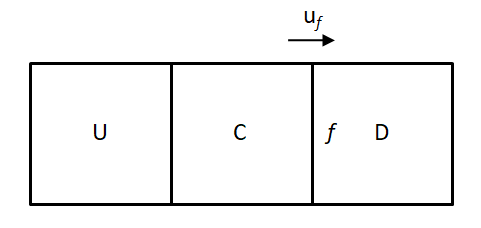

$$\phi_f = \phi_C + \frac{1-k}{4}\left(\phi_C - \phi_U\right) + \frac{1+k}{4}\left(\phi_D - \phi_C\right)$$

$\qquad$ where,

$\qquad k = -1$ : Second order upwind

$\qquad k = 0$  : FROMM

$\qquad k = 1/2$ : QUICK

$\qquad k = 1/3$ : Third order upwind

$\qquad k = 1$ : Central difference

- The following is the grid structure defined for the finite volume analysis. The fluxes are defined at the control surfaces, and $\phi$ is defined in cell centres.

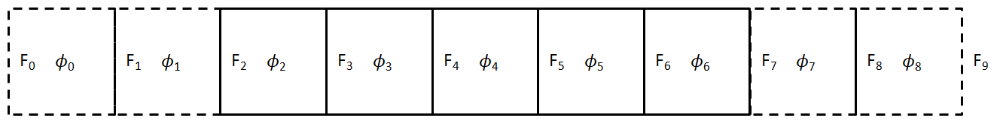

In [262]:
def step_fn(x, x0, x1):
    '''Step function with limits x0 and x1, and the array of shape grid'''
    res = x - x0
    res[x-x1 < x1] = 1
    res[x < x0] = 0
    res[x > x1] = 0
    return res

def gauss_fn(x, x0):
    '''Gaussian function with initial point x0, and an array of shape grid'''
    res = 0.08**2
    res = np.exp(-(x - x0)**2/res)
    return res

Time step size based on CFL 0.5 = 0.001953125 s


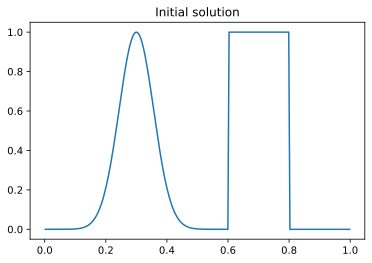

In [261]:
L = 1 # Domain length
n = 256 # Number of elements
dx = L/n
c = 1
tf = math.ceil(L/c) # Pass the domain atleast once

# Two ghost cells on either side, xs defined in cell centre (to plot ϕ)
xs = np.linspace(-dx*1.5, L+1.5*dx, n+4, endpoint = True)

# Solution arrays # See figure above
phi = np.zeros(n+4)
flux = np.zeros(n+5) # Even though (ghost) boundary fluxes will not be used, it will be useful for indexing

ϕ0 = gauss_fn(xs, 0.3) + step_fn(xs, 0.6, 0.8)

cfl = 0.5
dt = cfl*dx/c # CFL criteria
ts = int(tf/dt)
dt = tf/ts
print(f'Time step size based on CFL {cfl} = {dt} s')

plt.plot(xs[2:-2], ϕ0[2:-2])
plt.title('Initial solution')
plt.show()

In [232]:
def apply_periodic_BC(arr):
    '''Applying periodic BC on the solution array to obtain periodicity'''
    arr[-1] = arr[3]
    arr[-2] = arr[2]
    arr[0] = arr[-4]
    arr[1] = arr[-3]
    return arr

# Empty dictionary for storing k values, time, scheme name
k_vals = [-1, 0, 0.5, 1/3, 1]
schs = ['SOU', 'FROMM', 'QUICK', 'TOU', 'CDS']
s_time = []
s_dict = dict()

In [233]:
for j in range(len(k_vals)):
    
    ϕ_sol = []
    ϕ_sol.append(ϕ0)
    k = k_vals[j]
    print(f'{j+1}. k = {round(k, 3)}\t{schs[j]}')
    
    start = time.time()
    t = 0
    i = 0
    while t < tf:
        ϕ_n = ϕ_sol[-1]
        ϕ_n1 = np.zeros_like(ϕ0)

        # Periodic BCs - Ghost points equal opposite end interior points
        ϕ_n = apply_periodic_BC(ϕ_n)

        # Predictor ϕ
        flux[2:-2] = c*ϕ_n[1:-2] # Using upwind for the ϕ at faces
        ϕ_n1[2:-2] = ϕ_n[2:-2] - (dt*0.5/dx)*(flux[3:-2] - flux[2:-3])
        # Periodic BCs to the predictor
        ϕ_n1 = apply_periodic_BC(ϕ_n1)

        # Corrector - using k-scheme
        # Defining C, D and U cells for only interior cells
        # Use if statements to change the definitions for negative velocity
        ϕ_C = ϕ_n1[1:-2]
        ϕ_U = ϕ_n1[:-3]
        ϕ_D = ϕ_n1[2:-1]

        flux[2:-2] = c*(ϕ_C + 0.25*((1-k)*(ϕ_C - ϕ_U) + (1+k)*(ϕ_D - ϕ_C)))
        ϕ_n1[2:-2] = ϕ_n[2:-2] - (dt/dx)*(flux[3:-2] - flux[2:-3])

        ϕ_sol.append(ϕ_n1)
        i+=1

        time.sleep(dt)
        t+=dt
        progress = t / tf  # Calculate progress as a percentage
        update_progress_bar(int(t/dt), ts)

    update_progress_bar(ts, ts)
    end = time.time() - start
    print(f'\nTime taken for simulation: {round(end, 3)}s\n')
    
    # Storing k value, simulation time, and the solution inside a dictionary
    s_dict[schs[j]] = dict()
    s_dict[schs[j]]['time'] = end
    s_dict[schs[j]]['soln'] = ϕ_sol
    s_dict[schs[j]]['k'] = k

1. k = -1	SOU
Time step: [==================================================] 512/512 (100.00%)
Time taken for simulation: 7.94s

2. k = 0	FROMM
Time step: [==================================================] 512/512 (100.00%)
Time taken for simulation: 7.877s

3. k = 0.5	QUICK
Time step: [==================================================] 512/512 (100.00%)
Time taken for simulation: 7.508s

4. k = 0.333	TOU
Time step: [==================================================] 512/512 (100.00%)
Time taken for simulation: 7.859s

5. k = 1	CDS
Time step: [==================================================] 512/512 (100.00%)
Time taken for simulation: 8.16s



SOU - 19.693 s
FROMM - 23.088 s
QUICK - 20.181 s
TOU - 19.728 s
CDS - 19.066 s


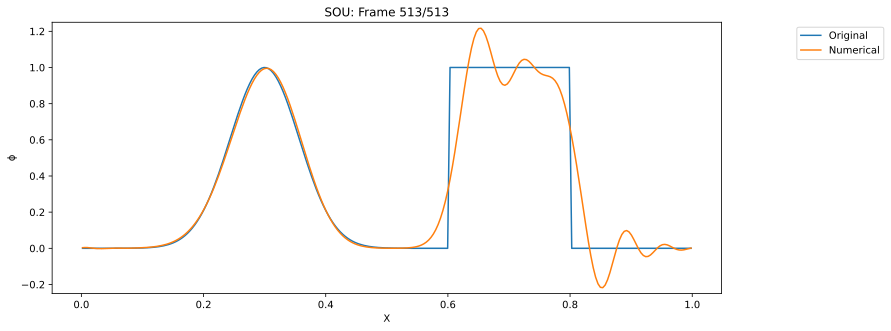

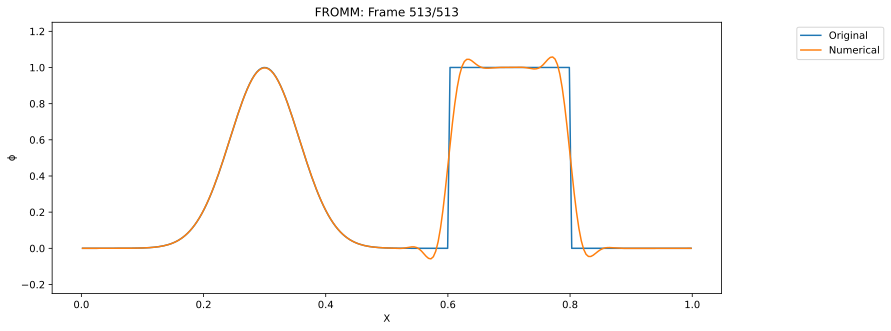

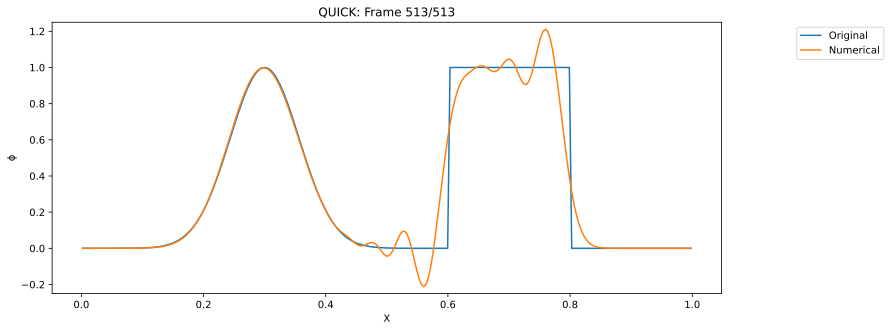

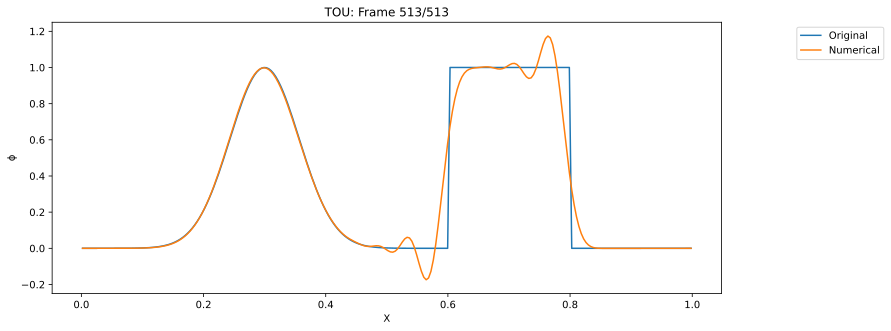

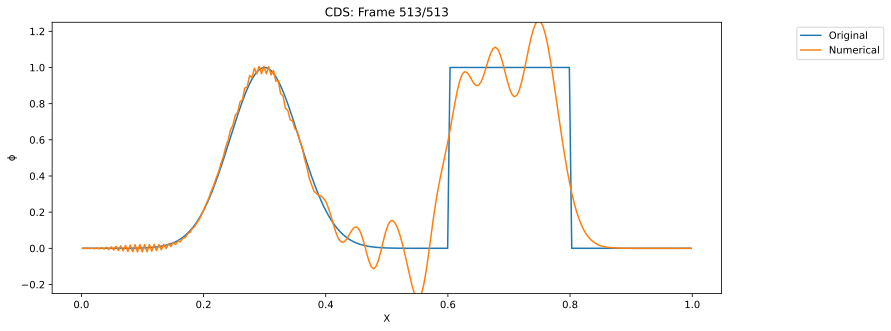

In [248]:
# Animations
def update(frame, data, name):
    ax.clear()  # Clear the previous plot
    # new_ϕ0 = np.roll(ϕ0, int(frame/2))
    ax.plot(xs[2:-2], ϕ0[2:-2], label = 'Original')
    ax.plot(xs[2:-2], data[frame][2:-2], label = 'Numerical')
    ax.legend(bbox_to_anchor = (1.25, 1))
    ax.set(xlabel = 'X', ylabel = 'ϕ', title = f'{name}: Frame {frame + 1}/{len(data)}', ylim = (-0.25, 1.25))

for scheme in schs:
    start = time.time()
    ϕ = s_dict[scheme]['soln']
    fig, ax = plt.subplots(figsize = (12, 5))
    n_frames = 200
    frames = list(range(0, len(ϕ), int(len(ϕ)/n_frames)))+[len(ϕ)-1]
    animation = anm.FuncAnimation(fig, update, fargs = (ϕ, scheme), frames = frames, repeat = False, interval = 100)
    animation.save(f'{scheme}.gif', writer = 'pillow', fps = 10)
    end = time.time() - start
    print(f'{scheme} - {round(end, 3)} s')

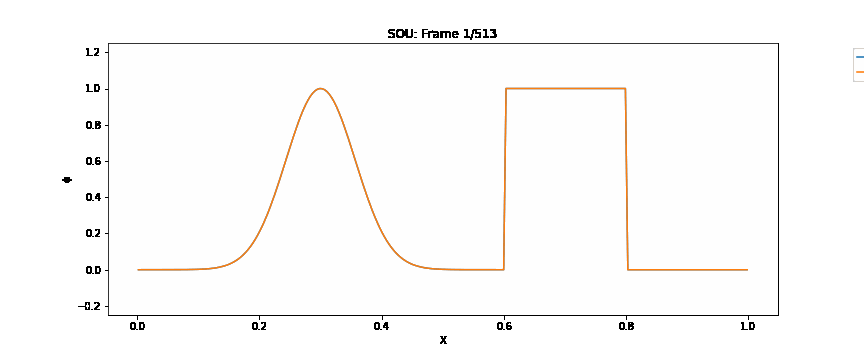

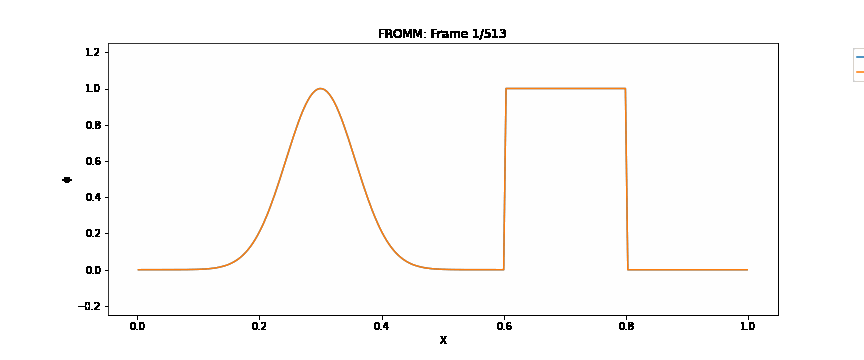

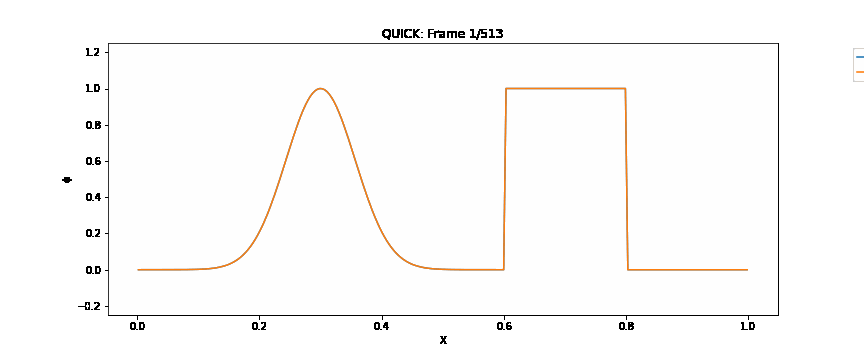

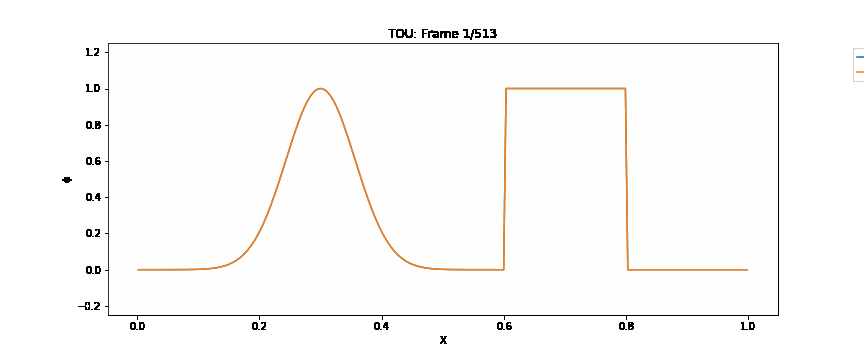

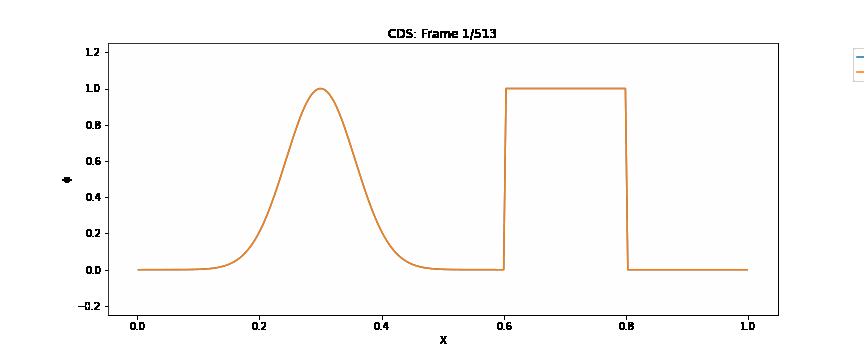

- QUICK and TOU have similar dispersion patterns, both being 3rd order upwind schemes
- Notice the large amount of dispersion in CDS scheme. It is heavily biased towards the downwind cell. The Modified equation for FTCS (using FDM) shows how it has a negative numerical diffusion coefficient, thus AMPLYFYING rather than dissipating numerically, making it an unstable scheme